# 4. Model Comparisons
We compare different models of dimensionality reductions
- PCA
- KernelPCA
- NMF
- tsne
- UMAP
  
with cross-validation (CV). Use the python environment `cloned_CNN2`.

In [1]:
import sys
import os
from skimage import exposure
import pandas as pd 
import numpy as np 
import cv2
import glob
from helpers import *
import matplotlib.pyplot as plt
from buildDataset import *
%matplotlib inline
from warnings import warn
from sklearn.decomposition import PCA, KernelPCA, NMF
from sklearn.manifold import TSNE
from sklearn.model_selection import KFold
from sklearn.naive_bayes import GaussianNB
import umap

X_stacked, y = getBalancedStackedXYData(normmode=None, normmode_thick=None)

../../2_Preprocessing_Code/amd/prl\dataset.py:8: FutureWarning: The `skimage.morphology.selem` module is deprecated and will be removed in scikit-image 1.0 (`skimage.morphology.selem` has been moved to `skimage.morphology.footprints`).
  from skimage.morphology import selem
c:\Users\line\.conda\envs\cloned_CNN2\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
xmin_thick = 6 #number of layers
X = X_stacked[:, -xmin_thick:]

X_train, y_train = X[:768*15*14,:], y[:768*15*14]
X_valid, y_valid = X[768*15*14:,:], y[768*15*14:]

print("training set:", X_train.shape[0])
print("validation set:", X_valid.shape[0])

training set: 161280
validation set: 32256


## 4.1 One model study.

### Train only one type of model.

In [ ]:
Models = [NMF]
dimred_normmode=['EUCLID', 'std', 'EUCLID-std']
savefile_normmode = dimred_normmode.copy()
kf = KFold(n_splits=6, shuffle=False)
savefile=['NMF']
gridsearch = [2,3,4,5,6]
for i, model in enumerate(Models):
    for n_comp in gridsearch:
        dimred_params = {
            'n_components': n_comp,
            'max_iter': 1000,
            'init': 'nndsvd'
        }
        for j, normmode in enumerate(dimred_normmode):
            plot_cv(model, X, y, dimred_params=dimred_params, dimred_normmode=normmode, cv=kf, savefile=savefile[i]+"_"+savefile_normmode[j]+"_n_components"+str(n_comp))

### classify only NMF dim reduced data
With Gaussian Naive Bayes

In [ ]:
model = GaussianNB
dimred_model = NMF
params = {
            'var_smoothing': 1e-8,
        }

dimred_normmode = 'EUCLID'
kf = KFold(n_splits=6, shuffle=False)
fig2, ax2 = plt.subplots(figsize=(6, 6))
gridsearch = [2,3,4,5,6]
for n_comp in gridsearch:
    dimred_params = {
        'n_components': n_comp,
        'max_iter': 1000,
        'init': 'nndsvd'
    }
    savefile = 'NB_NMF_EUCLID_n_comp' + str(n_comp)
    scores = score_dimred_model_PR(model, dimred_model, X, y, params, dimred_params, dimred_normmode, cv=kf, plotMatrix = False, plotROC = True, 
                                   ax2 = ax2, modelname = 'NB + NMF', savefile=savefile, label=f'n_components: {n_comp}')
    print(f'Here are the recall scores: {scores[::4]}')
    print(f'Here are the precisions scores: {scores[1::4]}')
    print(f'Here are the accuracies scores: {scores[2::4]}')
    print(f'Here are the f1 scores: {scores[3::4]}')
ax2.plot([0, 1], [0.17, 0.17], "k--", label="chance level (AP = 0.17)")
ax2.legend(loc="upper right")
ax2.set_title(f"NB + NMF on thicknesses")
fig2
fig2.savefig("figures/PRcurve/NB_NMF_EUCLID_n_comp")


With SVM

In [ ]:
from sklearn.svm import LinearSVC
from sklearn.calibration import CalibratedClassifierCV

model = CalibratedClassifierCV(LinearSVC(tol =  1e-5,random_state = 0))
dimred_model = NMF
params = None
dimred_normmode = 'EUCLID'
kf = KFold(n_splits=6, shuffle=False)
fig2, ax2 = plt.subplots(figsize=(6, 6))
gridsearch = [2,3,4,5,6]
for n_comp in gridsearch:
    dimred_params = {
        'n_components': n_comp,
        'max_iter': 1000,
        'init': 'nndsvd'
    }
    savefile = 'SVM_NMF_EUCLID_n_comp' + str(n_comp)
    scores = score_dimred_model_PR(model, dimred_model, X, y, params, dimred_params, dimred_normmode, cv=kf, plotMatrix = False, plotROC = True, ax2 = ax2, modelname = 'SVM + NMF', savefile=savefile, label=f'n_components: {n_comp}')
    print(f'Here are the recall scores: {scores[::4]}')
    print(f'Here are the precisions scores: {scores[1::4]}')
    print(f'Here are the accuracies scores: {scores[2::4]}')
    print(f'Here are the f1 scores: {scores[3::4]}')
ax2.plot([0, 1], [0.17, 0.17], "k--", label="chance level (AP = 0.17)")
ax2.legend(loc="upper right")
ax2.set_title(f"SVM + NMF on thicknesses")
fig2
fig2.savefig("figures/PRcurve/SVM_NMF_EUCLID_n_comp")

## 4.1.2 : TSNE 
Does not need train and test.

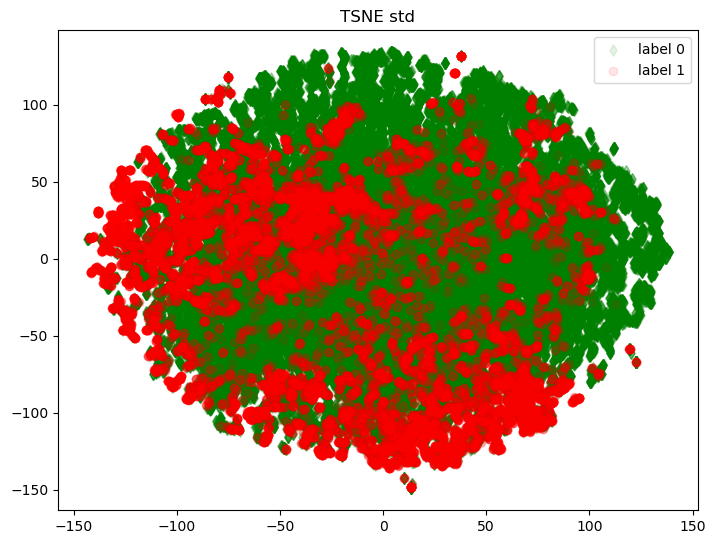

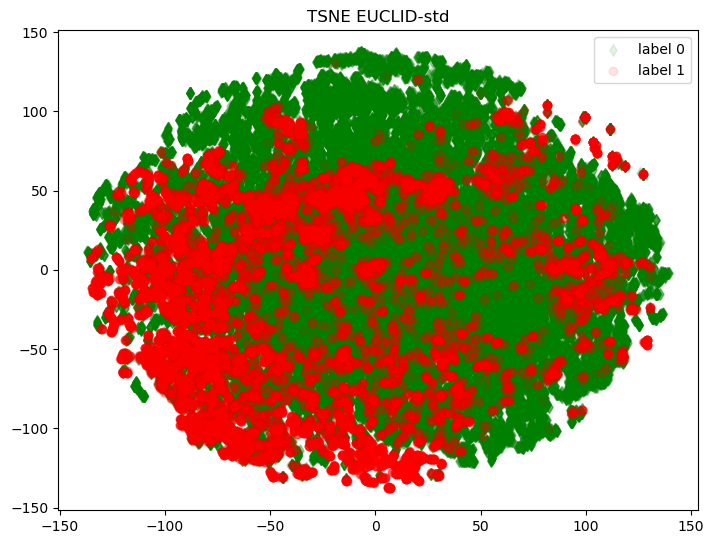

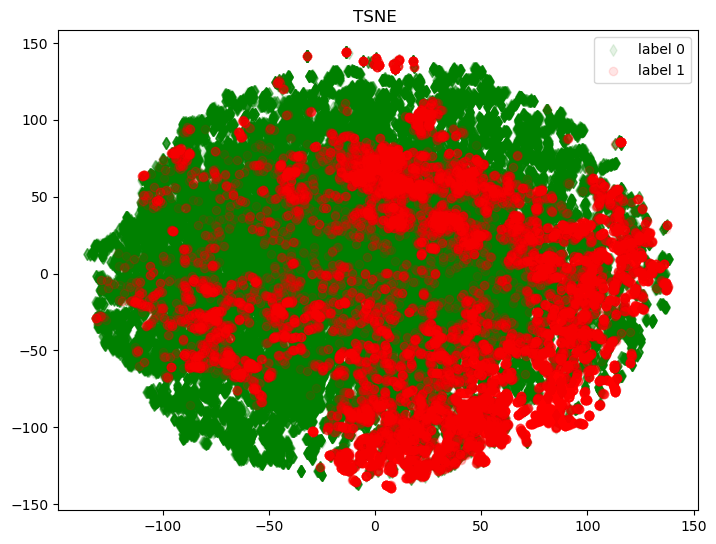

In [5]:
model = TSNE
params = {
    'n_components': 2,
    'learning_rate': 'auto',
    'init': 'random',
}
dimred_normmode=['std', 'EUCLID-std', '']
savefile_normmode = dimred_normmode.copy()
mask0 = np.array(1-y).astype(bool)
mask1 = np.array(y).astype(bool)
dimred_model = model(**params)

for j, normmode in enumerate(dimred_normmode):
    norm_X = NormalizeThickness(X, normmode)
    X_t = dimred_model.fit_transform(norm_X)
    # plot
    alpha = 0.1
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    ax.scatter(X_t[mask0,0], X_t[mask0,1], c='g', marker='d', alpha=alpha, label='label 0')
    ax.scatter(X_t[mask1,0], X_t[mask1,1],  c='r', marker='o', alpha=alpha, label='label 1')
    ax.legend()
    ax.set_title('TSNE '+ normmode)
    fig.savefig('figures/TSNE_'+savefile_normmode[j], bbox_inches='tight')
    

## 4.1.3 UMAP

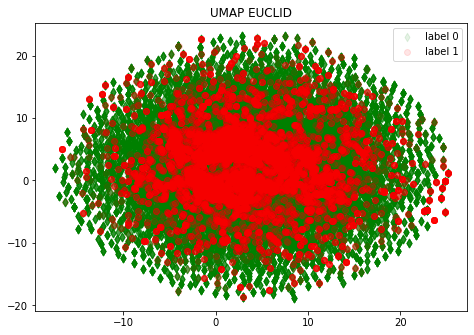

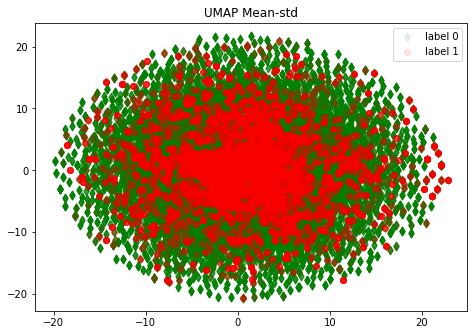

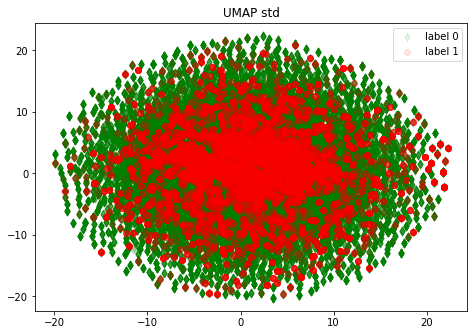

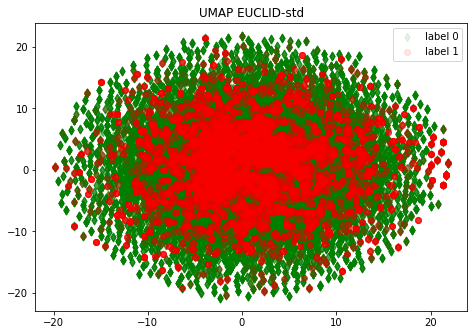

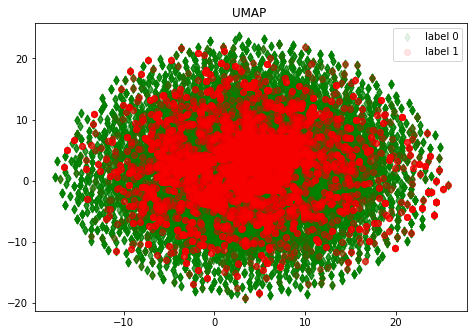

In [5]:
model = umap.UMAP
params = {
    'n_components': 2,
}
dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
savefile_normmode = dimred_normmode.copy()
mask0 = np.array(1-y).astype(bool)
mask1 = np.array(y).astype(bool)
dimred_model = model(**params)

for j, normmode in enumerate(dimred_normmode):
    norm_X = NormalizeThickness(X, normmode)
    X_t = dimred_model.fit_transform(norm_X)
    # plot
    alpha = 0.1
    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    ax.scatter(X_t[mask0,0], X_t[mask0,1], c='g', marker='d', alpha=alpha, label='label 0')
    ax.scatter(X_t[mask1,0], X_t[mask1,1],  c='r', marker='o', alpha=alpha, label='label 1')
    ax.legend()
    ax.set_title('UMAP '+ normmode)
    fig.savefig('figures/UMAP_'+savefile_normmode[j], bbox_inches='tight')

## 4.2 compare dim. reduction models

In [3]:
Models = [KernelPCA, PCA, NMF]
dimred_params=[None, None, {
    'n_components': 2,
    'max_iter': 1000,
    'init': 'nndsvd'
},
]
dimred_normmode=['EUCLID', 'Mean-std', 'std', 'EUCLID-std', '']
savefile_normmode = dimred_normmode.copy()
kf = KFold(n_splits=6, shuffle=False)
savefile=['KernelPCA', 'PCA', 'NMF_ncomp2']

START TRAINING: KernelPCA_EUCLID_fold_0
training set: 161280
Norm mode: EUCLID
M0.shape: (133475, 6)
M1.shape: (27805, 6)
M0.shape + M1.shape: 161280
Kernel PCA. Reduce the training data from  133475  to size: 5000
LABEL 0:

LABEL 1:
plotting...
START TRAINING: KernelPCA_EUCLID_fold_1
training set: 161280
Norm mode: EUCLID
M0.shape: (130360, 6)
M1.shape: (30920, 6)
M0.shape + M1.shape: 161280
Kernel PCA. Reduce the training data from  130360  to size: 5000
LABEL 0:

LABEL 1:
plotting...
2000
M0.shape[0]= 30257
M1.shape[0] 1999
1999
START TRAINING: KernelPCA_EUCLID_fold_2
training set: 161280
Norm mode: EUCLID
M0.shape: (133191, 6)
M1.shape: (28089, 6)
M0.shape + M1.shape: 161280
Kernel PCA. Reduce the training data from  133191  to size: 5000
LABEL 0:

LABEL 1:
plotting...
START TRAINING: KernelPCA_EUCLID_fold_3
training set: 161280
Norm mode: EUCLID
M0.shape: (133429, 6)
M1.shape: (27851, 6)
M0.shape + M1.shape: 161280
Kernel PCA. Reduce the training data from  133429  to size: 5000
L

c:\Users\line\Desktop\Mauro\5_Thickness\OCT_thickness\helpers.py:226: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(2, sharex=True, sharey=True)


START TRAINING: KernelPCA_Mean-std_fold_5
training set: 161280
Norm mode: Mean-std
M0.shape: (136316, 6)
M1.shape: (24964, 6)
M0.shape + M1.shape: 161280
Kernel PCA. Reduce the training data from  136316  to size: 5000
LABEL 0:

LABEL 1:
plotting...
START TRAINING: KernelPCA_std_fold_0
training set: 161280
Norm mode: std
M0.shape: (133475, 6)
M1.shape: (27805, 6)
M0.shape + M1.shape: 161280
Kernel PCA. Reduce the training data from  133475  to size: 5000
LABEL 0:

LABEL 1:
plotting...
START TRAINING: KernelPCA_std_fold_1
training set: 161280
Norm mode: std
M0.shape: (130360, 6)
M1.shape: (30920, 6)
M0.shape + M1.shape: 161280
Kernel PCA. Reduce the training data from  130360  to size: 5000
LABEL 0:

LABEL 1:
plotting...
2000
M0.shape[0]= 30257
M1.shape[0] 1999
1999
START TRAINING: KernelPCA_std_fold_2
training set: 161280
Norm mode: std
M0.shape: (133191, 6)
M1.shape: (28089, 6)
M0.shape + M1.shape: 161280
Kernel PCA. Reduce the training data from  133191  to size: 5000
LABEL 0:

LABEL

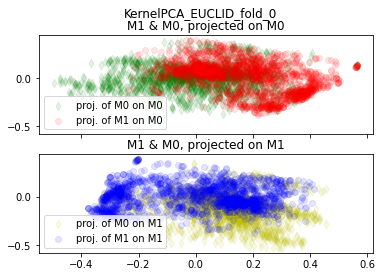

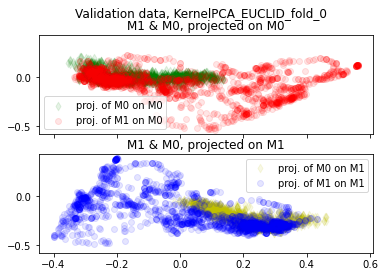

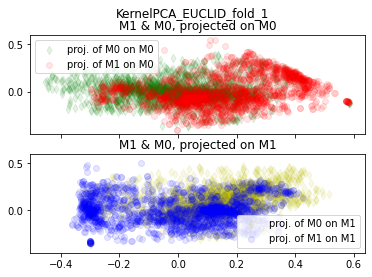

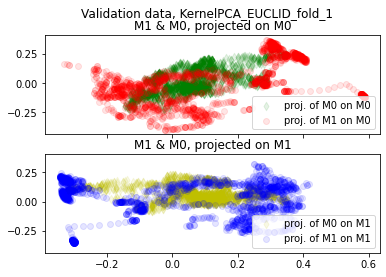

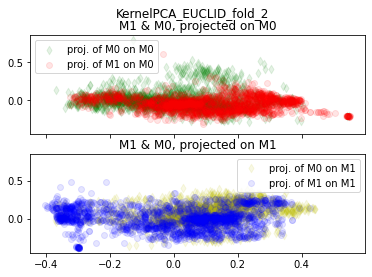

...

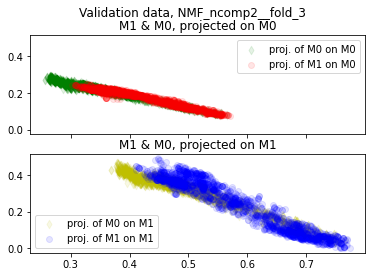

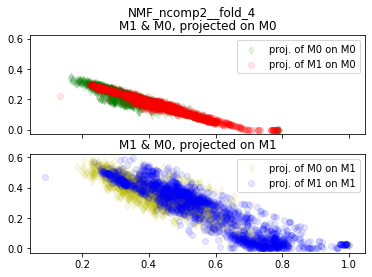

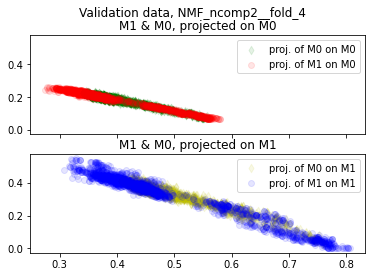

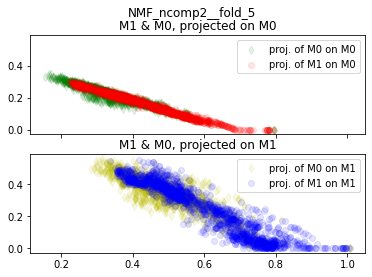

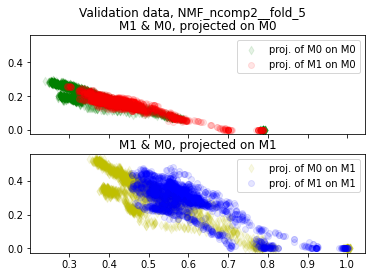

In [4]:
for i, model in enumerate(Models):
    for j, normmode in enumerate(dimred_normmode):
        if not ((normmode=='Mean-std') and (model==NMF)): # we need to exclude that case since NMF cannot deal with negative values.
            plot_cv(model, X, y, dimred_params=dimred_params[i], dimred_normmode=dimred_normmode[j], cv=kf, savefile=savefile[i]+"_"+savefile_normmode[j])